# Attention metric

In [1]:
import sys
from copy import deepcopy
from pathlib import Path

sys.path.append("../scripts/")

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import seaborn as sb
from helpers_various import time_str_to_time_s
from scipy.spatial.distance import squareform
from segmentations import Segmentations
from utils_cleaning import smooth_seg_dict, subtract_center_of_mass_seg_dict
from utils_draw import (
    compute_fig_lims,
    plot_frame,
    plot_graph,
    plot_graphx,
    plot_masks,
    plot_orientations,
    plot_presence,
    plot_trajectories,
    plot_time_series_by_window
)
from utils_io import convert_to_dict
from utils_networks import *
from utils_sync import (
    compute_view_intersections,
    compute_view_lines,
    diving_order,
    find_stable_periods
)

sb.set_theme(style="ticks", context="paper")


results_dir = "../results/attention/"
data_dir = "../data/pre-birth/"

Path(results_dir).mkdir(parents=True, exist_ok=True)
Path(data_dir).mkdir(parents=True, exist_ok=True)

%load_ext autoreload
%autoreload 2

/home/poetz/anaconda3/envs/ceti/lib/python3.9/site-packages/numba/core/decorators.py:250: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


## Load all segmentation files

In [ ]:
import glob 

data_files = glob.glob("../data/last/1688*.hdf5")

In [7]:
vid_numbers = [file_name.split("/")[-1].split("_")[0] for file_name in data_files]
sorted_vid_idcs = np.argsort(vid_numbers)
vid_numbers = list(np.sort(vid_numbers))

In [5]:
whens = [file_name.split("/")[2].split("-")[0] for file_name in data_files]
whens = list(np.array(whens)[sorted_vid_idcs])
data_files = list(np.array(data_files)[sorted_vid_idcs])

In [8]:
import pickle as pk

file_name = f"../data/last/adjacencies_focus.pkl"
with open(file_name, "rb") as fp:
    adjacencies_matrices = pk.load(fp)
    
file_name = '../data/last/segmentations_clean.pkl'
with open(file_name, "rb") as fp:
    segmentations = pk.load(fp)

In [9]:
#remove last frames of video 1688830733272 because there is only 1 whale visible

last_frame = 5500

adjacencies_matrices['1688830733272'] = adjacencies_matrices['1688830733272'][:last_frame]

from utils_cleaning import slice_seg

segmentations['1688830733272'] = slice_seg(segmentations['1688830733272'], frame_max=last_frame)

## Compute attention

In [10]:
calf_attentions = {}
mom_attentions = {}
allan_attentions = {}
whales_attentions = {}
whales_std = {}
whales_max = {}

# Loop through each video number using the keys in the adjacency matrices
for vid_number in adjacencies_matrices.keys():
    # Retrieve segmentation info for current video
    seg = segmentations[vid_number]
    # Retrieve adjacency matrix for current video
    adj = adjacencies_matrices[vid_number]
    
    # Compute the mean of adjacency values across axis=1 (rows)
    time_series = np.nanmean(adj, axis=1)
    
    # Check if 'Calf' is in the IDs list, store its index
    if 'Calf' in seg['ids']:
        calf_idx = seg['ids'].index('Calf')
    else:
        calf_idx = None
        
    # Check if 'Rounder' is in the IDs list, store its index
    if 'Rounder' in seg['ids']:
        mom_idx = seg['ids'].index('Rounder')
    else:
        mom_idx = None
        
    # Check if 'Allan' is in the IDs list, store its index
    if 'Allan' in seg['ids']:
       allan_idx = seg['ids'].index('Allan')
    else:
       allan_idx = None
        
    # Store calf attention or fill with None if missing
    if calf_idx is not None:
        calf_attentions[vid_number] = time_series[:, calf_idx]
    else:
        calf_attentions[vid_number] = [None]*time_series.shape[0]
        
    # Store mom attention or fill with None if missing
    if mom_idx is not None:
        mom_attentions[vid_number] = time_series[:, mom_idx]
    else:
        mom_attentions[vid_number] = [None]*time_series.shape[0]
        
    # Store Allan's attention or fill with None if missing
    if allan_idx is not None:
        allan_attentions[vid_number] = time_series[:, allan_idx]
    else:
        allan_attentions[vid_number] = [None]*time_series.shape[0]
    
    # Build a list of indexes to remove from time_series
    list_to_delete = [mom_idx, calf_idx, allan_idx]
    list_to_delete = [x for x in list_to_delete if x is not None]

    # Remove those columns so only 'whale' data remains
    time_series = np.delete(time_series, list_to_delete, axis=1)
    
    # Calculate mean, std, and max across remaining columns (whale data)
    whales_attentions[vid_number] = np.nanmean(time_series, axis=1)
    whales_std[vid_number] = np.nanstd(time_series, axis=1)
    whales_max[vid_number] = np.nanmax(time_series, axis=1)

/tmp/ipykernel_3766906/1640542634.py:16: RuntimeWarning: Mean of empty slice
  time_series = np.nanmean(adj, axis=1)
/tmp/ipykernel_3766906/1640542634.py:62: RuntimeWarning: Mean of empty slice
  whales_attentions[vid_number] = np.nanmean(time_series, axis=1)
/home/poetz/anaconda3/envs/ceti/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/tmp/ipykernel_3766906/1640542634.py:64: RuntimeWarning: All-NaN slice encountered
  whales_max[vid_number] = np.nanmax(time_series, axis=1)


In [11]:
df_calf = pd.DataFrame.from_dict(calf_attentions, orient='index')
df_mom = pd.DataFrame.from_dict(mom_attentions, orient='index')
df_allan = pd.DataFrame.from_dict(allan_attentions, orient='index')
df_whales = pd.DataFrame.from_dict(whales_attentions, orient='index')
df_whales_max = pd.DataFrame.from_dict(whales_max, orient='index')
df_whales_std = pd.DataFrame.from_dict(whales_std, orient='index')

df_calf_long = df_calf.melt(ignore_index=False, var_name="frame", value_name="attentions_calf")
df_mom_long = df_mom.melt(ignore_index=False, var_name="frame", value_name="attentions_mom")
df_allan_long = df_allan.melt(ignore_index=False, var_name="frame", value_name="attentions_allan")
df_whales_long = df_whales.melt(ignore_index=False, var_name="frame", value_name="attentions_whales")
df_whales_std_long = df_whales_std.melt(ignore_index=False, var_name="frame", value_name="attentions_whales_std")
df_whales_max_long = df_whales_max.melt(ignore_index=False, var_name="frame", value_name="attentions_whales_max")

df_calf_long

,frame,attentions_calf
1688827433752,0,NaN
1688827660979,0,NaN
1688827887072,0,NaN
1688828965144,0,NaN
1688829151574,0,NaN
...,...,...
1688831830406,6808,None
1688832540499,6808,None
1688832767759,6808,None
1688832995052,6808,None


In [12]:
timestamps_s = {}
timestamps_s_babyTime = {}
timestamps_str = {}

for vid_number in vid_numbers:

    seg = segmentations[vid_number]

    timestamps_s[vid_number] = seg["timestamps_s"]
    timestamps_s_babyTime[vid_number] = seg["timestamps_s_babyTime"]
    timestamps_str[vid_number] = seg["timestamps_str"]

In [13]:
df_timestamps_s = pd.DataFrame.from_dict(timestamps_s, orient='index')
df_timestamps_s_babyTime = pd.DataFrame.from_dict(timestamps_s_babyTime, orient='index')
df_timestamps_str = pd.DataFrame.from_dict(timestamps_str, orient='index')

df_timestamps_s_long = df_timestamps_s.melt(ignore_index=False, var_name="frame", value_name="timestamps_s")
df_timestamps_s_babyTime_long = df_timestamps_s_babyTime.melt(ignore_index=False, var_name="frame", value_name="timestamps_s_babyTime")
df_timestamps_str_long = df_timestamps_str.melt(ignore_index=False, var_name="frame", value_name="timestamps_str")

df_timestamps_str_long

,frame,timestamps_str
1688827433752,0,2023-07-08 10:43:54.550590 -0400
1688827660979,0,2023-07-08 10:47:41.777590 -0400
1688827887072,0,2023-07-08 10:51:27.870590 -0400
1688828965144,0,2023-07-08 11:09:25.942590 -0400
1688829151574,0,2023-07-08 11:12:37.671219 -0400
...,...,...
1688831830406,6808,None
1688832540499,6808,None
1688832767759,6808,None
1688832995052,6808,None


In [14]:
# the following crashes
#df_long = pd.merge(df_gcc_sizes_long, df_n_whales_long, left_index=True, right_index=True, how="left")

# so we merge manually because too many elements
df_long = df_calf_long.copy()
df_long["attentions_mom"] = df_mom_long["attentions_mom"]
df_long["attentions_allan"] = df_allan_long["attentions_allan"]
df_long["attentions_whales"] = df_whales_long["attentions_whales"]
df_long["attentions_whales_std"] = df_whales_std_long["attentions_whales_std"]
df_long["attentions_whales_max"] = df_whales_max_long["attentions_whales_max"]

df_long["timestamps_s"] = df_timestamps_s_long["timestamps_s"]
df_long["timestamps_s_babyTime"] = df_timestamps_s_babyTime_long["timestamps_s_babyTime"]
df_long["timestamps_str"] = df_timestamps_str_long["timestamps_str"]
df_long

,frame,attentions_calf,attentions_mom,attentions_allan,attentions_whales,attentions_whales_std,attentions_whales_max,timestamps_s,timestamps_s_babyTime,timestamps_str
1688827433752,0,NaN,NaN,NaN,NaN,NaN,NaN,1.688827e+09,-3710.449410,2023-07-08 10:43:54.550590 -0400
1688827660979,0,NaN,0.172538,NaN,0.099047,0.480746,0.659898,1.688828e+09,-3483.222410,2023-07-08 10:47:41.777590 -0400
1688827887072,0,NaN,0.831460,NaN,0.251066,0.362127,0.842898,1.688828e+09,-3257.129410,2023-07-08 10:51:27.870590 -0400
1688828965144,0,NaN,NaN,NaN,NaN,NaN,NaN,1.688829e+09,-2179.057410,2023-07-08 11:09:25.942590 -0400
1688829151574,0,NaN,0.724190,-0.099008,0.622209,0.230221,0.938478,1.688829e+09,-1987.328781,2023-07-08 11:12:37.671219 -0400
...,...,...,...,...,...,...,...,...,...,...
1688831830406,6808,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None
1688832540499,6808,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None
1688832767759,6808,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None
1688832995052,6808,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None


In [15]:
df_long = df_long.reset_index()
df_long.rename(columns={'index':"video_number"}, inplace=True)

df_long

,video_number,frame,attentions_calf,attentions_mom,attentions_allan,attentions_whales,attentions_whales_std,attentions_whales_max,timestamps_s,timestamps_s_babyTime,timestamps_str
0,1688827433752,0,NaN,NaN,NaN,NaN,NaN,NaN,1.688827e+09,-3710.449410,2023-07-08 10:43:54.550590 -0400
1,1688827660979,0,NaN,0.172538,NaN,0.099047,0.480746,0.659898,1.688828e+09,-3483.222410,2023-07-08 10:47:41.777590 -0400
2,1688827887072,0,NaN,0.831460,NaN,0.251066,0.362127,0.842898,1.688828e+09,-3257.129410,2023-07-08 10:51:27.870590 -0400
3,1688828965144,0,NaN,NaN,NaN,NaN,NaN,NaN,1.688829e+09,-2179.057410,2023-07-08 11:09:25.942590 -0400
4,1688829151574,0,NaN,0.724190,-0.099008,0.622209,0.230221,0.938478,1.688829e+09,-1987.328781,2023-07-08 11:12:37.671219 -0400
...,...,...,...,...,...,...,...,...,...,...,...
115748,1688831830406,6808,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None
115749,1688832540499,6808,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None
115750,1688832767759,6808,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None
115751,1688832995052,6808,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None


In [16]:
df_metadata = pd.read_csv("../data/videos_metadata.csv", sep="\t")
keep = ["video_number", "start", "end"]
df_metadata = df_metadata[keep]
#df_metadata.at[13, "end"] = '11:42:00'

#df_metadata

In [17]:
from datetime import time

birth_start = time(11, 12, 45)
birth_end = time(11, 45, 45)
later = time(14, 0, 0)

def assign_period(t):
    if t < birth_start:
        return "pre"
    elif birth_start <= t and t < birth_end:
        return "during"
    elif birth_end <= t and t < later:
        return "post"
    elif t >= later:
        return "late"



In [19]:
df_summary = pd.merge(left=df_long, right=df_metadata, left_on="video_number", right_on="video_number", how="left")
df_summary['start'] = pd.to_datetime(df_summary['start'], format='%H:%M:%S').dt.time

df_summary["when"] = df_summary["start"].apply(assign_period)
#summary_df['start'] = pd.to_datetime(df_summary['start'], format='%H:%M:%S')
df_summary['start'] = pd.to_datetime(df_summary['start'], format='%H:%M:%S').apply(lambda x: x.replace(year=2024, month=1, day=1))

#df_summary

In [20]:
keep_cols = ["video_number", "start", "end", "timestamps_str", "when"]
df_median = df_summary.groupby(keep_cols).median().reset_index()
df_mean = df_summary.groupby(keep_cols).mean().reset_index()
df_std = df_summary.groupby(keep_cols).std().reset_index()

/home/poetz/anaconda3/envs/ceti/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/poetz/anaconda3/envs/ceti/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/poetz/anaconda3/envs/ceti/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/poetz/anaconda3/envs/ceti/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/poetz/anaconda3/envs/ceti/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/poetz/anaconda3/envs/ceti/lib/python3.9/site-packages/numpy/lib/nanfu

In [21]:
mask = df_summary["when"] == "during"
mask_vid = df_summary["video_number"] == "1688829151574"

In [22]:
df_summary["timestamps_str"].unique()

array(['2023-07-08 10:43:54.550590 -0400',
       '2023-07-08 10:47:41.777590 -0400',
       '2023-07-08 10:51:27.870590 -0400', ...,
       '2023-07-08 10:47:41.643590 -0400',
       '2023-07-08 10:47:41.677590 -0400',
       '2023-07-08 10:47:41.710590 -0400'], dtype=object)

In [23]:
df_summary = df_summary.sort_values("timestamps_s")

In [24]:
df_summary[mask_vid]

/tmp/ipykernel_3766906/839743579.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_summary[mask_vid]


,video_number,frame,attentions_calf,attentions_mom,attentions_allan,attentions_whales,attentions_whales_std,attentions_whales_max,timestamps_s,timestamps_s_babyTime,timestamps_str,start,end,when
4,1688829151574,0,NaN,0.724190,-0.099008,0.622209,0.230221,0.938478,1.688829e+09,-1987.328781,2023-07-08 11:12:37.671219 -0400,2024-01-01 11:12:37,11:13:17,pre
21,1688829151574,1,NaN,0.724206,-0.097915,0.620630,0.231931,0.941848,1.688829e+09,-1987.296781,2023-07-08 11:12:37.703219 -0400,2024-01-01 11:12:37,11:13:17,pre
38,1688829151574,2,NaN,0.724887,-0.096507,0.620460,0.231934,0.942838,1.688829e+09,-1987.263781,2023-07-08 11:12:37.736219 -0400,2024-01-01 11:12:37,11:13:17,pre
55,1688829151574,3,NaN,0.721695,-0.100148,0.618499,0.234088,0.944353,1.688829e+09,-1987.229781,2023-07-08 11:12:37.770219 -0400,2024-01-01 11:12:37,11:13:17,pre
72,1688829151574,4,NaN,0.722116,-0.104226,0.618088,0.233068,0.944505,1.688829e+09,-1987.197781,2023-07-08 11:12:37.802219 -0400,2024-01-01 11:12:37,11:13:17,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115672,1688829151574,6804,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None,2024-01-01 11:12:37,11:13:17,pre
115689,1688829151574,6805,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None,2024-01-01 11:12:37,11:13:17,pre
115706,1688829151574,6806,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None,2024-01-01 11:12:37,11:13:17,pre
115723,1688829151574,6807,None,NaN,None,NaN,NaN,NaN,NaN,NaN,None,2024-01-01 11:12:37,11:13:17,pre


In [25]:
win_size = 300

df_summary_rolling_windows = df_summary.copy()
df_summary_rolling_windows["attentions_calf"] = df_summary_rolling_windows["attentions_calf"].rolling(window=win_size, min_periods=1).mean()
df_summary_rolling_windows["attentions_mom"] = df_summary_rolling_windows["attentions_mom"].rolling(window=win_size, min_periods=1).mean()
df_summary_rolling_windows["attentions_allan"] = df_summary_rolling_windows["attentions_allan"].rolling(window=win_size, min_periods=1).mean()
df_summary_rolling_windows["attentions_whales"] = df_summary_rolling_windows["attentions_whales"].rolling(window=win_size, min_periods=1).mean()
df_summary_rolling_windows["attentions_whales_std"] = df_summary_rolling_windows["attentions_whales_std"].rolling(window=win_size, min_periods=1).mean()
df_summary_rolling_windows["attentions_whales_max"] = df_summary_rolling_windows["attentions_whales_max"].rolling(window=win_size, min_periods=1).mean()

In [26]:
pre = df_summary_rolling_windows[df_summary_rolling_windows['when'] == 'pre']['timestamps_s_babyTime']
df_summary_rolling_windows[df_summary_rolling_windows['when'] == 'pre']['timestamps_s_babyTime']

during = df_summary_rolling_windows[df_summary_rolling_windows['when'] == 'during']['timestamps_s_babyTime']
df_summary_rolling_windows[df_summary_rolling_windows['when'] == 'during']['timestamps_s_babyTime'].max()

post = df_summary_rolling_windows[df_summary_rolling_windows['when'] == 'post']['timestamps_s_babyTime']
df_summary_rolling_windows[df_summary_rolling_windows['when'] == 'post']['timestamps_s_babyTime'].max()

late = df_summary_rolling_windows[df_summary_rolling_windows['when'] == 'late']['timestamps_s_babyTime']
df_summary_rolling_windows[df_summary_rolling_windows['when'] == 'post']['timestamps_s_babyTime'].max()

times = [pre, during, post, late]


In [27]:
df_summary_rolling_windows

,video_number,frame,attentions_calf,attentions_mom,attentions_allan,attentions_whales,attentions_whales_std,attentions_whales_max,timestamps_s,timestamps_s_babyTime,timestamps_str,start,end,when
0,1688827433752,0,NaN,NaN,NaN,NaN,NaN,NaN,1.688827e+09,-3710.44941,2023-07-08 10:43:54.550590 -0400,2024-01-01 10:43:54,10:47:41,pre
17,1688827433752,1,NaN,NaN,NaN,NaN,NaN,NaN,1.688827e+09,-3710.41541,2023-07-08 10:43:54.584590 -0400,2024-01-01 10:43:54,10:47:41,pre
34,1688827433752,2,NaN,NaN,NaN,NaN,NaN,NaN,1.688827e+09,-3710.38141,2023-07-08 10:43:54.618590 -0400,2024-01-01 10:43:54,10:47:41,pre
51,1688827433752,3,NaN,NaN,NaN,NaN,NaN,NaN,1.688827e+09,-3710.34941,2023-07-08 10:43:54.650590 -0400,2024-01-01 10:43:54,10:47:41,pre
68,1688827433752,4,NaN,NaN,NaN,NaN,NaN,NaN,1.688827e+09,-3710.31641,2023-07-08 10:43:54.683590 -0400,2024-01-01 10:43:54,10:47:41,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115748,1688831830406,6808,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,2024-01-01 11:57:12,11:59:13,post
115749,1688832540499,6808,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,2024-01-01 12:09:01,12:12:48,post
115750,1688832767759,6808,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,2024-01-01 12:12:48,12:16:35,post
115751,1688832995052,6808,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,2024-01-01 12:16:35,12:20:23,post


In [28]:
df_summary_rolling_windows = df_summary_rolling_windows.sort_values(by="timestamps_s_babyTime")
df_summary_rolling_windows = df_summary_rolling_windows.dropna(subset=['timestamps_s_babyTime'])

## Plot results

In [30]:
series_whales = df_summary_rolling_windows["attentions_whales"]
series_mom = df_summary_rolling_windows["attentions_mom"]
series_allan = df_summary_rolling_windows["attentions_allan"]
series_calf = df_summary_rolling_windows["attentions_calf"]
series_whales_std = df_summary_rolling_windows["attentions_whales_std"]
ts = df_summary_rolling_windows["timestamps_s_babyTime"]

with open(f"{results_dir}series_data.pkl", "wb") as f:
    pk.dump({
        "series_whales": series_whales,
        "series_mom": series_mom,
        "series_allan": series_allan,
        "series_calf": series_calf,
        "timestamps": ts,
        "series_whales_std": series_whales_std
    }, f)

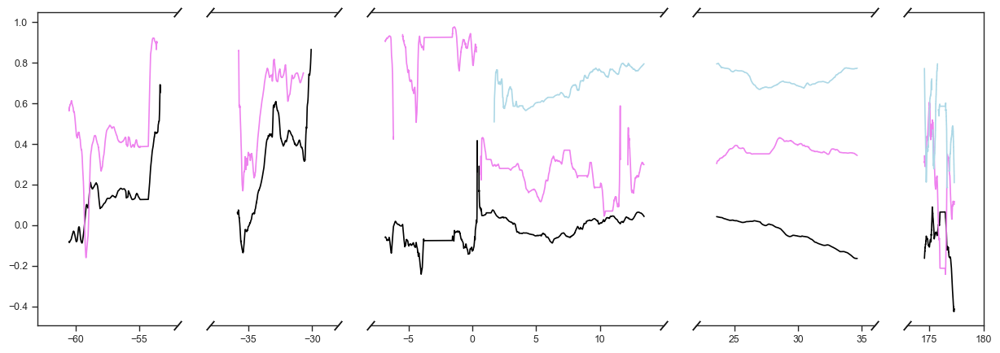

In [36]:
#time_windows = [(0, 10), (30, 40), (40, 60), (60, 80), (80, 100)]

birth_start = -2000 / 60
birth_end = 0
later = 5000 / 60

# Define a simple time-phase mapping
def time_phase_mapping(t):
    if t < birth_start:
        return "pre"
    elif birth_start <= t and t < birth_end:
        return "during"
    elif birth_end <= t and t < later:
        return "post"
    elif t >= later:
        return "later"


plot_regions_xlims_s = np.array([
    [-3780.0, -3120.0],
    [-2280.0, -1680.0],
    [-480.0, 900.0],
    [1320.0, 2160.0],
    [10380.0, 10740.0],
]) / 60

# Call the function
fig, axs = plot_time_series_by_window(
    series_whales,
    times=ts / 60,
    colors=['black','black','black','black'],
    time_windows=plot_regions_xlims_s,
    time_phase_mapping=time_phase_mapping,
    show_legend=False,
    
)

plot_time_series_by_window(
    series_mom,
    times=ts / 60,
    colors=['violet','violet','violet','violet'],
    axs=axs,
    time_windows=plot_regions_xlims_s,
    time_phase_mapping=time_phase_mapping,
    show_legend=False,
    
)

plot_time_series_by_window(
    series_calf,
    times=ts / 60,
    colors=['blue','blue','lightblue','lightblue'],
    axs=axs,
    time_windows=plot_regions_xlims_s,
    time_phase_mapping=time_phase_mapping,
    show_legend=False,
    
)

axs[1].set_xticks([-35, -30])
axs[2].set_xticks([-5, 0, 5, 10])
axs[4].set_xticks([175, 180])
#axs[4].tick_params(axis='y', labelright=False)

results_dir = "../results/attention/"
fig_name = f"fig_attention_v2"
plt.savefig(f"{results_dir}{fig_name}.pdf", dpi=250, bbox_inches="tight", facecolor="w")

plt.show()

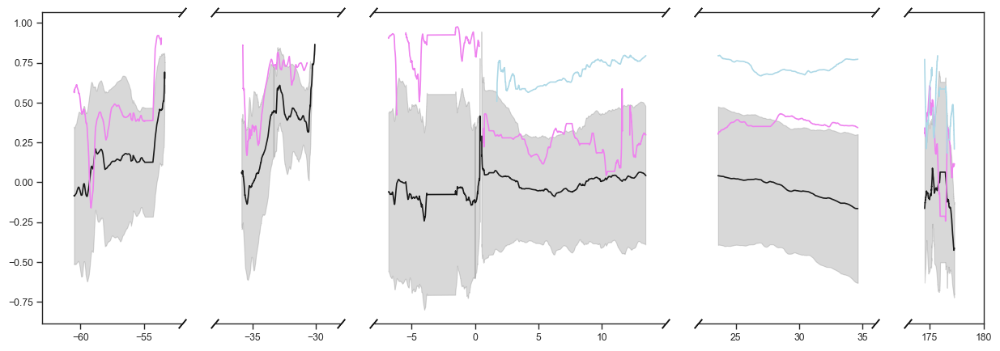

In [39]:
from utils_draw import plot_time_series_by_window_fill_between

#time_windows = [(0, 10), (30, 40), (40, 60), (60, 80), (80, 100)]

birth_start = -2000 / 60
birth_end = 0
later = 5000 / 60

# Define a simple time-phase mapping
def time_phase_mapping(t):
    if t < birth_start:
        return "pre"
    elif birth_start <= t and t < birth_end:
        return "during"
    elif birth_end <= t and t < later:
        return "post"
    elif t >= later:
        return "later"


plot_regions_xlims_s = np.array([
    [-3780.0, -3120.0],
    [-2280.0, -1680.0],
    [-480.0, 900.0],
    [1320.0, 2160.0],
    [10380.0, 10740.0],
]) / 60

# Call the function
fig, axs = plot_time_series_by_window(
    series_whales,
    times=ts / 60,
    colors='k',
    time_windows=plot_regions_xlims_s,
    time_phase_mapping=time_phase_mapping,
    show_legend=False,
    
)

plot_time_series_by_window(
    series_mom,
    times=ts / 60,
    colors=['violet','violet','violet','violet'],
    axs=axs,
    time_windows=plot_regions_xlims_s,
    time_phase_mapping=time_phase_mapping,
    show_legend=False,
    
)

plot_time_series_by_window(
    series_calf,
    times=ts / 60,
    colors=['red','red','lightblue','lightblue'],
    axs=axs,
    time_windows=plot_regions_xlims_s,
    time_phase_mapping=time_phase_mapping,
    show_legend=False,
    
)

plot_time_series_by_window_fill_between(
    series_whales,
    times=ts / 60,
    std = series_whales_std,
    colors=['gray'],
    time_windows=plot_regions_xlims_s,
    time_phase_mapping=time_phase_mapping,
    show_legend=False,
    axs=axs
)

axs[1].set_xticks([-35, -30])
axs[2].set_xticks([-5, 0, 5, 10])
axs[4].set_xticks([175, 180])
#axs[4].tick_params(axis='y', labelright=False)

results_dir = "../results/attention/"
fig_name = f"fig_attention_v2"
plt.savefig(f"{results_dir}{fig_name}.pdf", dpi=250, bbox_inches="tight", facecolor="w")

plt.show()